#                                                **DEEP LEARNING PROJECT-2**


---







*   **NAVEEN BALARAJU**(UB:50251459)
*   **AVINASH KAMMARDI SASHIPRAKASH**(UB:50292823)





# SEGEMENTATION OF BRAIN TUMORS(LOW GRADE GLIOMAS)



*   The objective of this project is to develop and automatic Image segmentation algorithm to detect the low grade brain tumors.
*   Recent studies have discovered that low grade 
gliomas are associated with the genomic subtypes that have a particular feature shape 
and by analyzing the feature shape we can predict which genomic subtype that was responsible 
for the development of the brain tumor.
*   The conventional way to findout the genomic subtype 
is by making a biopsy which involves making and incision into the skull and collecting the tissue 
from the tumor site which involves a huge amount of risk factors.
*   For more details we encougare 
you to read the referenced paper below.
*   we have implemented Three models "**U-net**", "**MultiRes Unet**" and a model porosped by us that we have named it as "**Proposed Unet Model"**.







# REFERENCES

*   Paper1: https://arxiv.org/pdf/1902.04049.pdf
*   Paper2: https://arxiv.org/pdf/1906.03720.pdf
*   Image pre-processing: https://keras.io/preprocessing/image/
*   Data Augmentation: https://fairyonice.github.io/Learn-about-ImageDataGenerator.html
*   Dice Coefficient: https://www.ncbi.nlm.nih.gov/pmc/articles/PMC1415224/figure/F1/
*   Author Github Link:https://github.com/MaciejMazurowski/brain-segmentation









# DEPENDENT PACKAGES

In [0]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import tensorflow as tf
import cv2
from keras import layers
from keras.models import Sequential
from keras.models import Input
from keras.models import Model
from keras.layers.convolutional import Conv2D
from keras.layers import Conv2DTranspose
from keras.layers import Dense
from keras.layers import Flatten
from keras.layers import Activation
from keras.layers import ReLU
from keras.layers import BatchNormalization
from keras.layers import UpSampling2D
from keras.layers import MaxPooling2D
from keras.layers import Concatenate
from keras.layers import Reshape
from keras.layers import add
from keras.utils import plot_model
from keras.optimizers import Adam
import pickle
import os
from keras import backend as K
from sklearn.model_selection import train_test_split
from keras.models import load_model
from keras.preprocessing.image import ImageDataGenerator
from unetbatchnorm import UNET_model_batchnorm

# MOUNTING TO DRIVE

In [0]:
from google.colab import drive
drive.mount('/content/drive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/drive


# HYPERPARAMETERS



*   The hyper parameters are choosen according to values specified in the paper by the Author.



In [0]:
imagesize = 256
batch_size = 32
Optimizer = Adam(lr=1e-5)
epoch = 360

# DATA VISUALIZATION

*   This Dataset consists of 3929 images and their corresponding mask.
*   All the images and masks are pre-processed and resized to 256x256x1 before feeding into the Unet,Multires Unet and proposed Unet.



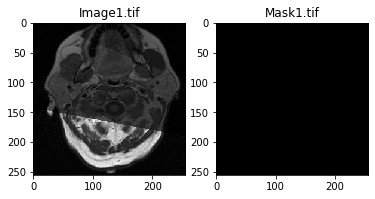

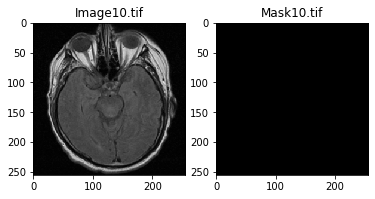

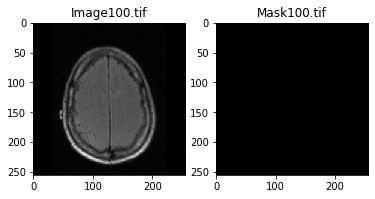

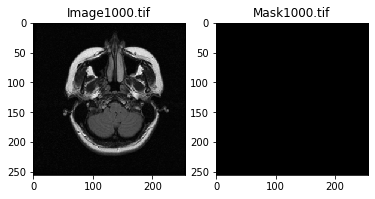

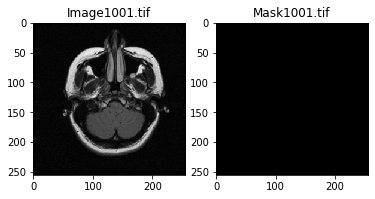

...

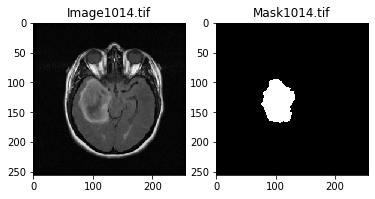

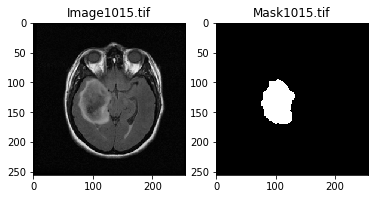

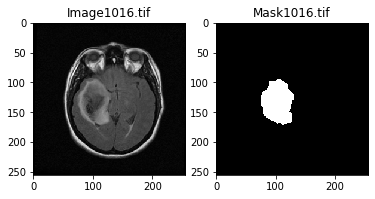

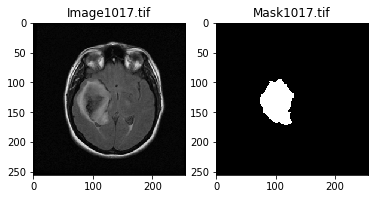

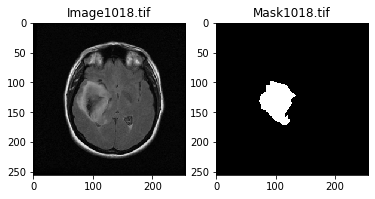

KeyboardInterrupt: ignored

In [0]:
data_dir = '/content/drive/My Drive/Colab Notebooks/Deep learning- project 2/Brain_tumor_dataset'
img_path = os.path.join(data_dir,'Images')
#print(img_path)
mask_path = os.path.join(data_dir,'Masks')
#print(mask_path)

for img,mask in zip(sorted(os.listdir(img_path)),sorted(os.listdir(mask_path))):
  #print(img)
  #print(mask)
  img_array = cv2.imread(os.path.join(img_path,img),cv2.IMREAD_GRAYSCALE)
  img_arr_resize = cv2.resize(img_array,(imagesize,imagesize))
  mask_array = cv2.imread(os.path.join(mask_path,mask),cv2.IMREAD_GRAYSCALE)
  mask_arr_resize = cv2.resize(mask_array,(imagesize,imagesize))

  fig = plt.figure()
  ax = fig.add_subplot(1, 2, 1)
  plt.title(f'Image{img}')
  ax.imshow(img_array,cmap='gray')

  ax = fig.add_subplot(1, 2, 2)
  plt.title(f'Mask{mask}')
  ax.imshow(mask_array,cmap='gray')
  plt.show()

# DATA LOADING,PRE-PROCESSING AND PICKLING

In [0]:
train_image = []
train_mask = []
for img,mask in zip(sorted(os.listdir(img_path)),sorted(os.listdir(mask_path))):
  img_array = cv2.imread(os.path.join(img_path,img),cv2.IMREAD_GRAYSCALE)
  img_arr_resize = cv2.resize(img_array,(imagesize,imagesize))
  train_image.append(img_arr_resize)
  mask_array = cv2.imread(os.path.join(mask_path,mask),cv2.IMREAD_GRAYSCALE)
  mask_arr_resize = cv2.resize(mask_array,(imagesize,imagesize))
  train_mask.append(mask_arr_resize)

In [0]:
print(f'Number of training images: {len(train_image)}')
print(f'Number of training mask: {len(train_mask)}')

Number of training images: 3929
Number of training mask: 3929


In [0]:
image_data  = np.array(train_image).reshape(-1,imagesize,imagesize,1)
mask_data  = np.array(train_mask).reshape(-1,imagesize,imagesize,1)

In [0]:
print(f'Shape of training images: {image_data.shape}')
print(f'Shape of training mask: {mask_data.shape}')

Shape of training images: (3929, 256, 256, 1)
Shape of training mask: (3929, 256, 256, 1)


**SAVING THE IMAGES AND MASK DATA AS PICKLE FILES**

In [0]:
i = open('Image.pickle','wb')
pickle.dump(image_data,i)
i.close()

m = open('Mask.pickle','wb')
pickle.dump(mask_data,m)
m.close()

**LOADING THE SAVED PICKLE FILES**

In [0]:
pkl_img = open('Image.pickle','rb')
Final_image_data = pickle.load(pkl_img)

pkl_img = open('Mask.pickle','rb')
Final_mask_data = pickle.load(pkl_img)

print(f'Shape of training images: {Final_image_data.shape}')
print(f'Shape of training mask: {Final_mask_data.shape}')

Shape of training images: (3929, 256, 256, 1)
Shape of training mask: (3929, 256, 256, 1)


# SPLITTING THE DATA INTO TRAIN, VALIDATION AND TEST DATA

In [0]:
# Normalizing the Data

Final_image_data = Final_image_data/255.0
Final_mask_data = Final_mask_data/255.0

# Splitting The dataset

Training_images,Validation_images,Training_mask,Validation_masks = train_test_split(Final_image_data,Final_mask_data,test_size=0.15,random_state=42)
del(Final_image_data)
del(Final_mask_data)
Validation_images,Test_images,Validation_masks,Test_masks = train_test_split(Validation_images,Validation_masks,test_size=0.15,random_state=42)


print(f'Training Images shape:{Training_images.shape}')
print(f'Training Mask shape:{Training_mask.shape}')
print(f'Validation Images shape:{Validation_images.shape}')
print(f'Validation Mask shape:{Validation_masks.shape}')
print(f'Test Images shape:{Test_images.shape}')
print(f'Test Mask shape:{Test_masks.shape}')

Training Images shape:(3339, 256, 256, 1)
Training Mask shape:(3339, 256, 256, 1)
Validation Images shape:(501, 256, 256, 1)
Validation Mask shape:(501, 256, 256, 1)
Test Images shape:(89, 256, 256, 1)
Test Mask shape:(89, 256, 256, 1)


# DATA AUGMENTATION

*  To improve the performance of the model, data augementaion was applied to both the images and their corresponding mask.The type of transformation applied to an image can be found in "Dataaugmentation.ipynb".



In [0]:

data_gen_args = dict(rotation_range=45,width_shift_range=0.1,height_shift_range=0.1,zoom_range=0.2)
image_datagen = ImageDataGenerator(**data_gen_args)
mask_datagen = ImageDataGenerator(**data_gen_args)


seed = 6
batch_size = 32



image_generator = image_datagen.flow(Training_images,seed=seed,batch_size=batch_size,shuffle = True)
mask_generator = mask_datagen.flow(Training_mask,seed=seed,batch_size=batch_size,shuffle = True)


# combining generators into one which yields image and masks
train_generator = zip(image_generator, mask_generator)

# LOSS FUNCTION


*   The DICE similarity is used the measure the similarity between the two segmentation maps.
*   The DICE similarity coefficient is given by DSC(A,B)= 2(A∩B)/(A+B).
*   The coefficient values ranges between 0-1. If there is a perfect overlap between the two segmentation maps then DICE score is 1.
*   If there is partial overlap then the DICE score is between 0 and 1.
*   If there is no overlap between the segementation maps then DICE score is 0.







In [0]:
smooth = 1.0
def dice_coef(y_true, y_pred):
  y_true_f = K.flatten(y_true)
  y_pred_f = K.flatten(y_pred)
  intersection = K.sum(y_true_f * y_pred_f)
  return (2. * intersection + smooth) / (K.sum(y_true_f) + K.sum(y_pred_f) + smooth)


def dice_coef_loss(y_true, y_pred):
  return -dice_coef(y_true, y_pred)

# **TRAINING UNET MODEL**

*   The U-net model is a CNN with an Encoder(Contracting path) and a Decoder (Expanding path).
*   The Goal of the Encoder is to learn "what" is present in the Image.In the Contracting path, the Size of the image is reduced while increasing the depth(channels).The output image size after the contracting path is 16x16x512.
*   The Encoder consist of Convolution layer with the Max pooling layer with stride 2 and 2x2 filters that reduces the size of a image in half. For expample a 8x8 image after maxpooling will reduced to 4x4. Also, the maxpooling layer helps to reduce the number of parameters for the next layer.Although, the image size and parameters are reduced the context of what is present in the Image almost remains the same. However, the encoder part cannot remember 'where' the feature is present.
*   The Decoder works in a opposite manner to the Encoder part. It converts an Low resolution image into a high resolution image using transposed convolution, from which we can recover both 'what' feature and 'where' it is present.
*   The Input to the Decoder is an image of dimension of 16x16x512, and this images undergoes a series of transposed convolution and outputs an image of 256x256x1.In order to get precise location of the feature, the skip connection is used from the Encoder to Decoder.
*   The Skip connection is given in the following order.
1.   Down block 1 ---> Up block 4
2.   Down block 2 ---> Up block 3
3.   Down block 3 ---> Up block 2
4.   Down block 4 ---> Up block 1
















# UNET MODEL

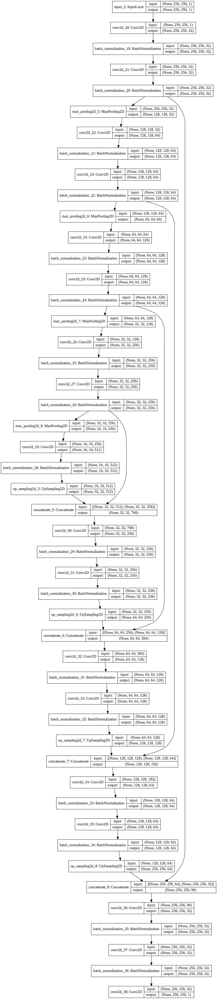

In [0]:
Unet = UNET_model_batchnorm()
plot_model(Unet,show_shapes=True)

In [0]:
Unet.summary()

Model: "model_2"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_2 (InputLayer)            (None, 256, 256, 1)  0                                            
__________________________________________________________________________________________________
conv2d_20 (Conv2D)              (None, 256, 256, 32) 320         input_2[0][0]                    
__________________________________________________________________________________________________
batch_normalization_19 (BatchNo (None, 256, 256, 32) 128         conv2d_20[0][0]                  
__________________________________________________________________________________________________
conv2d_21 (Conv2D)              (None, 256, 256, 32) 9248        batch_normalization_19[0][0]     
____________________________________________________________________________________________

In [0]:
Unet.compile(optimizer=Optimizer,loss=dice_coef_loss,metrics=[dice_coef])

In [0]:
Unet_training = Unet.fit_generator(train_generator,steps_per_epoch=(len(Training_images)//batch_size),epochs=epoch,verbose = 1,validation_data=(Validation_images,Validation_masks))

# Saving the trained Unet model
path_save_model = '/content/drive/My Drive/Colab Notebooks/Deep learning- project 2'
Unet.save(os.path.join(path_save_model,"Unet_trained_model_with_dataaug_360epoch.h5"))
print('Successfuly saved the trained Unet model into the Drive..!!!!!!!')

# METRICS AND LOSS PLOTS

In [0]:
train_dice_coef = Unet_training.history['dice_coef']
train_loss = Unet_training.history['loss']

validation_dice_coef = Unet_training.history['val_dice_coef']
validation_loss = Unet_training.history['val_loss']
Number_of_epochs = range(len(train_dice_coef))


i = open('train_dice_coef.pickle','wb')
pickle.dump(train_dice_coef,i)
i.close()

i = open('train_loss.pickle','wb')
pickle.dump(train_loss,i)
i.close()

i = open('validation_dice_coef.pickle','wb')
pickle.dump(validation_dice_coef,i)
i.close()


i = open('validation_loss.pickle','wb')
pickle.dump(validation_loss,i)
i.close()

i = open('Number_of_epochs.pickle','wb')
pickle.dump(Number_of_epochs,i)
i.close()

In [0]:
# Loading the Pickle files
p = open('train_dice_coef.pickle','rb')
train_dice_coef = pickle.load(p)

p = open('train_loss.pickle','rb')
train_loss = pickle.load(p)

p = open('validation_dice_coef.pickle','rb')
validation_dice_coef = pickle.load(p)

p = open('validation_loss.pickle','rb')
validation_loss = pickle.load(p)


p = open('Number_of_epochs.pickle','rb')
Number_of_epochs = pickle.load(p)

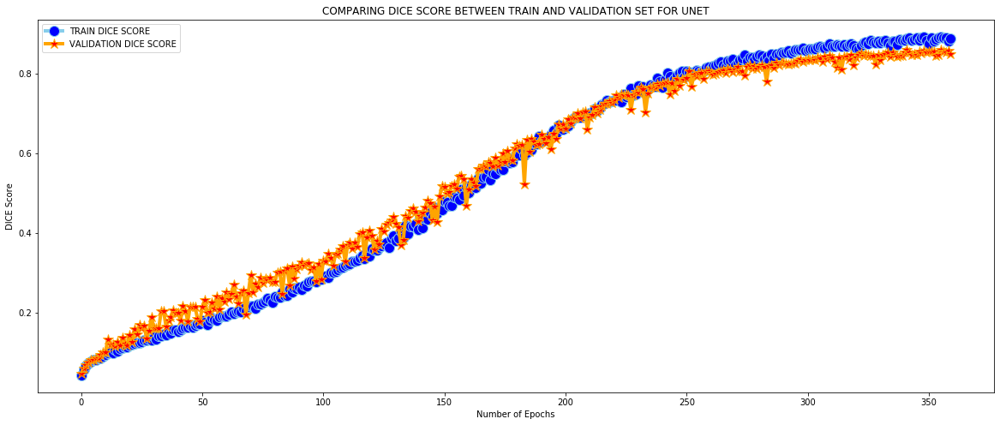

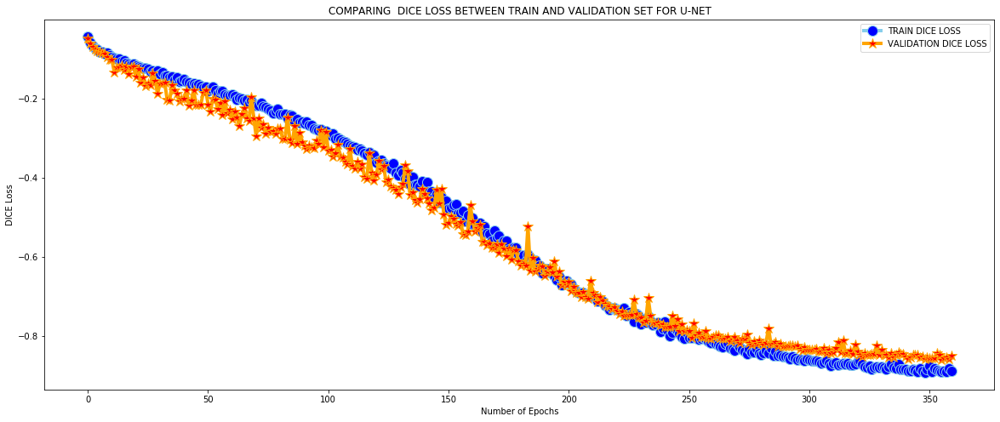

In [0]:
plt.figure(figsize=(20,8))
plt.title('COMPARING DICE SCORE BETWEEN TRAIN AND VALIDATION SET FOR UNET')
plt.plot(Number_of_epochs,train_dice_coef,marker='o',markerfacecolor='blue',markersize=12,color='skyblue',linewidth=4,label='TRAIN DICE SCORE')
plt.plot(Number_of_epochs,validation_dice_coef,marker='*',markerfacecolor='red',markersize=12,color='orange',linewidth=4,label='VALIDATION DICE SCORE')
plt.xlabel('Number of Epochs')
plt.ylabel('DICE Score')
plt.legend()
plt.savefig('Dice_score.png')
plt.show()



plt.figure(figsize=(20,8))
plt.title('COMPARING  DICE LOSS BETWEEN TRAIN AND VALIDATION SET FOR U-NET')
plt.plot(Number_of_epochs,train_loss,marker='o',markerfacecolor='blue',markersize=12,color='skyblue',linewidth=4,label='TRAIN DICE LOSS')
plt.plot(Number_of_epochs,validation_loss,marker='*',markerfacecolor='red',markersize=12,color='orange',linewidth=4,label='VALIDATION DICE LOSS')
plt.xlabel('Number of Epochs')
plt.ylabel('DICE Loss')
plt.legend()
plt.savefig('Dice_loss.png')
plt.show()

# EVALUATING UNET MODEL PERFORMANCE ON TEST DATA 

In [0]:
saved_unet_model = load_model('Unet_trained_model_with_dataaug_360epoch.h5',custom_objects={'dice_coef_loss': dice_coef_loss,'dice_coef':dice_coef})

In [0]:
pred = saved_unet_model.predict(Test_images,verbose=1)

89/89 [==============================] - 5s 59ms/step


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  This is separate from the ipykernel package so we can avoid doing imports until


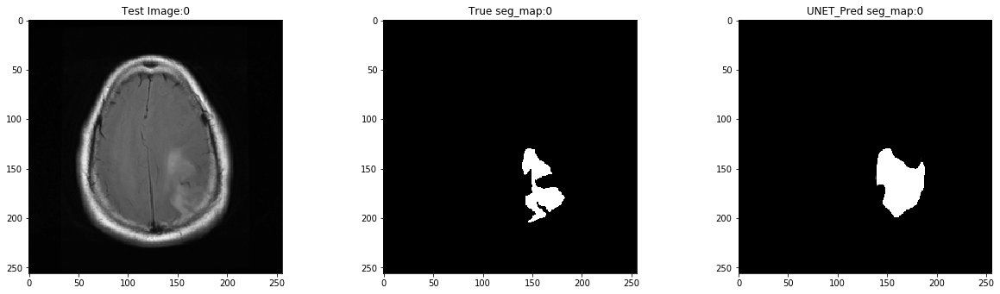

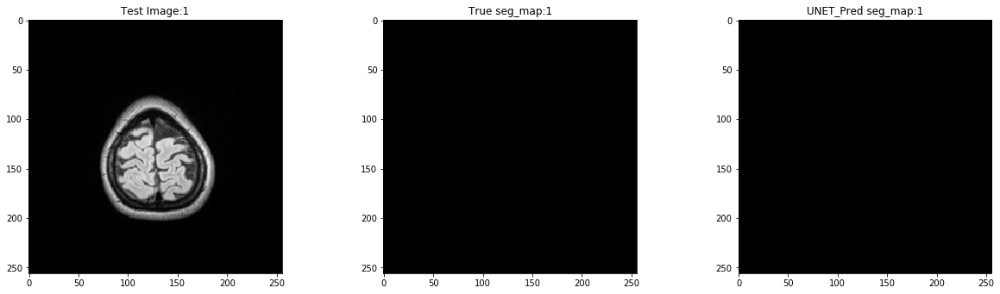

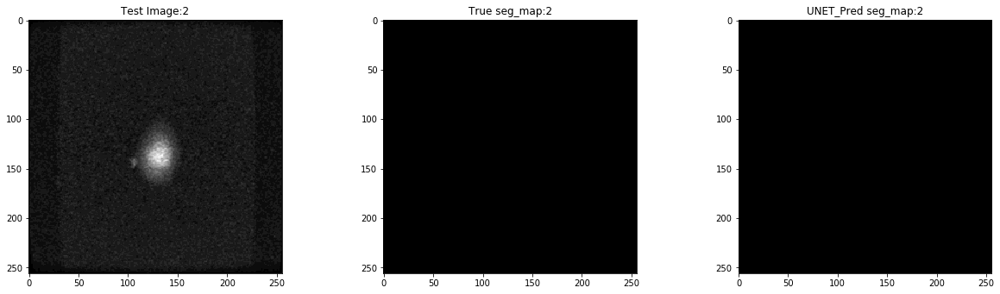

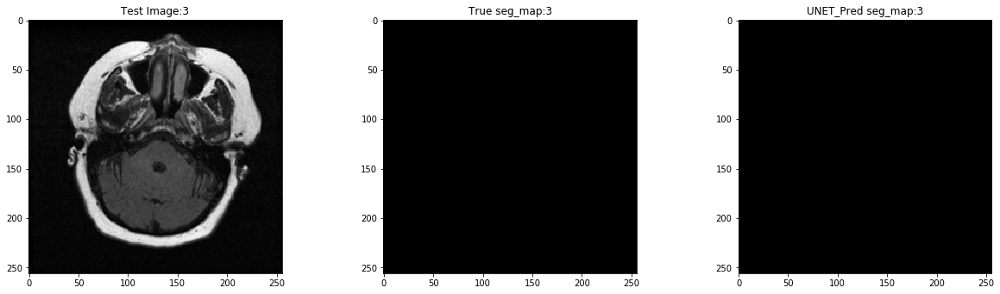

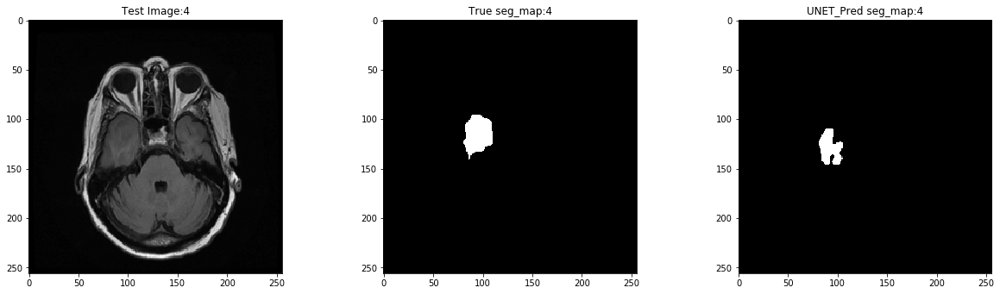

...

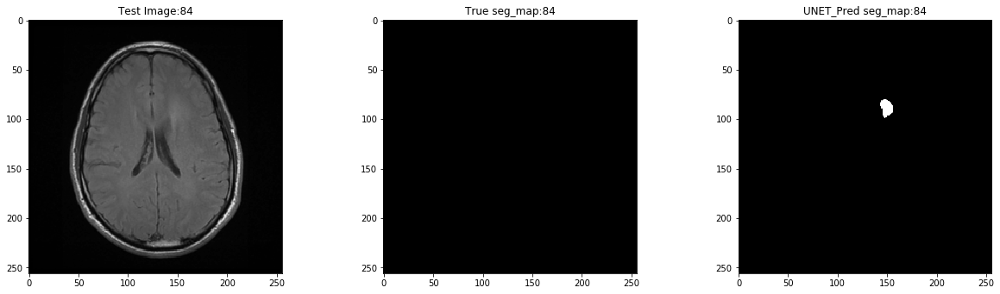

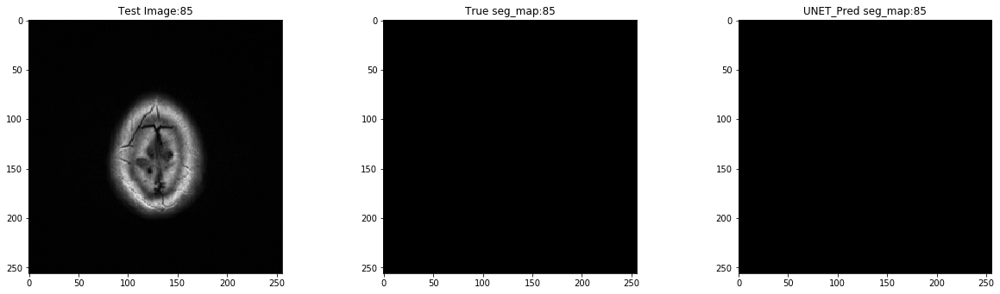

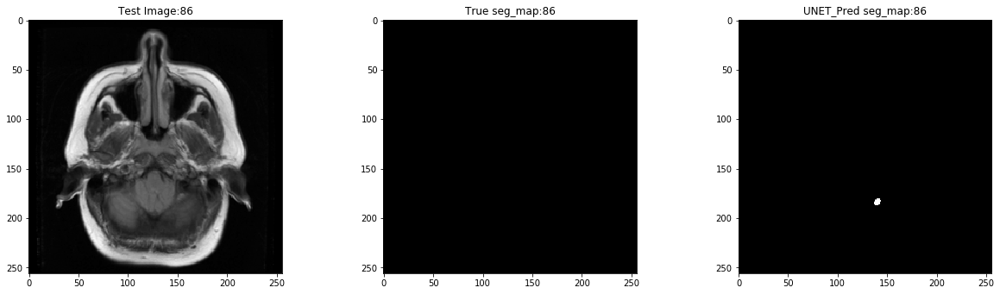

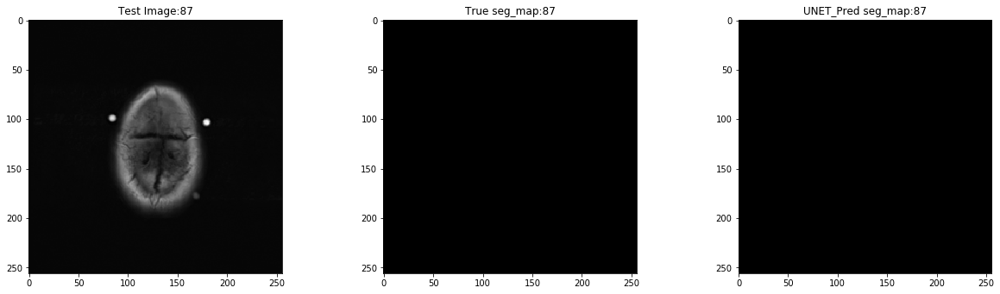

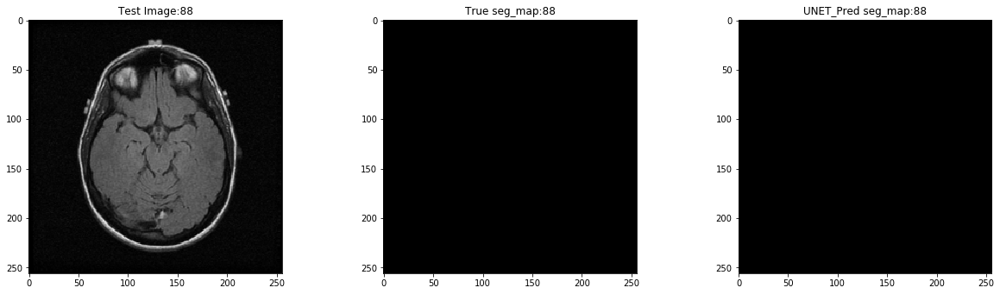

In [0]:

for i in range(len(pred)):
  fig = plt.figure(figsize=(20,15))
  fig.subplots_adjust(hspace=0.6, wspace=0.4)

  ax = fig.add_subplot(1, 3, 1)
  plt.title(f'Test Image:{i}')
  ax.imshow(np.reshape(Test_images[i]*255, (imagesize,imagesize)), cmap="gray")

  ax = fig.add_subplot(1, 3, 2)
  plt.title(f'True seg_map:{i}')
  ax.imshow(np.reshape(Test_masks[i]*255, (imagesize,imagesize)), cmap="gray")

  ax = fig.add_subplot(1, 3, 3)
  plt.title(f'UNET_Pred seg_map:{i}')
  ax.imshow(np.reshape(pred[i]*255, (imagesize,imagesize)), cmap="gray")
